# Random Forest

- Its a bagging of Decision trees used for classification as well as regression.

- Random forest takes random number off features(columns)  and random number of examples(rows) and based on that created various trees.

-  Random forest builds multiple decision trees which may ave different sets of hyperparameters fo each of them  and merges them together to get a more accurate and stable prediction by voting (not-weighted).

-  Great quality of the random forest algorithm is that it is very easy to measure the relative importance of each feature on the prediction.

## Difference of Decision tree and Random forest

-  If you put the features and labels into a decision tree, it will generate some rules that helps to make prediction, In comparison the random forest algorithm randomly selects observations and features to build several decision trees and then averages the results.
- Decision Tree creates Deep trees which are prone to overfit on contrary random foest creates shallow trees.
- It gives the indications of importnce assigned to the features of data.

## Steps in Random Forest

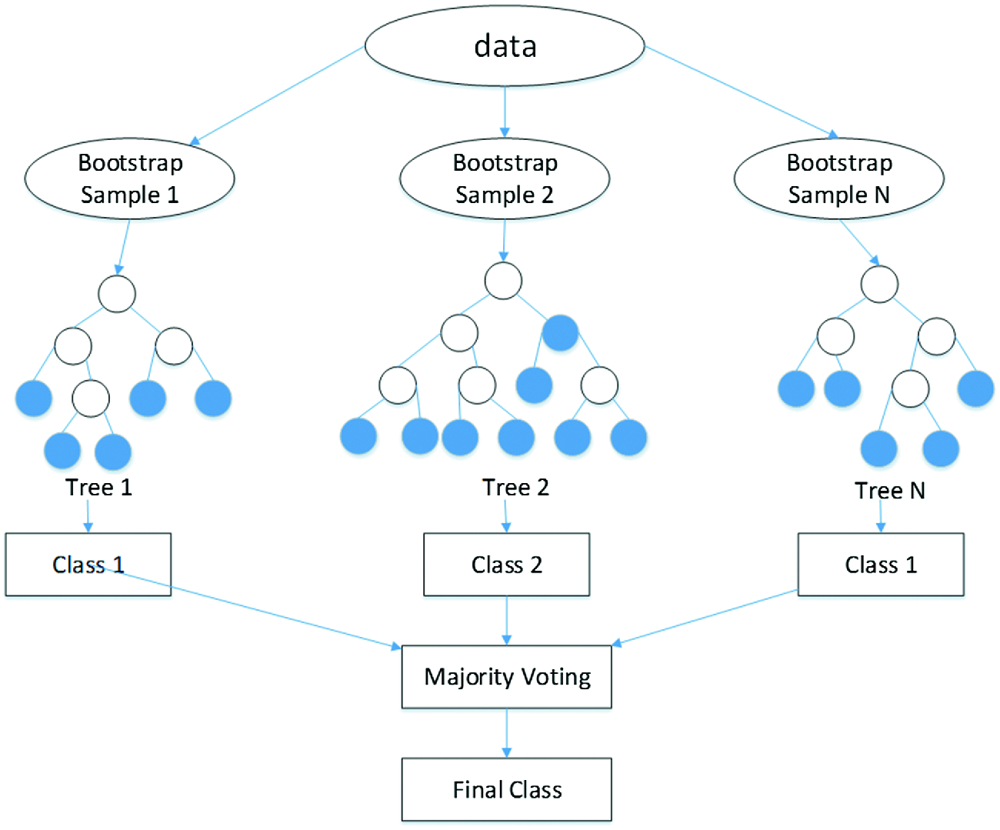


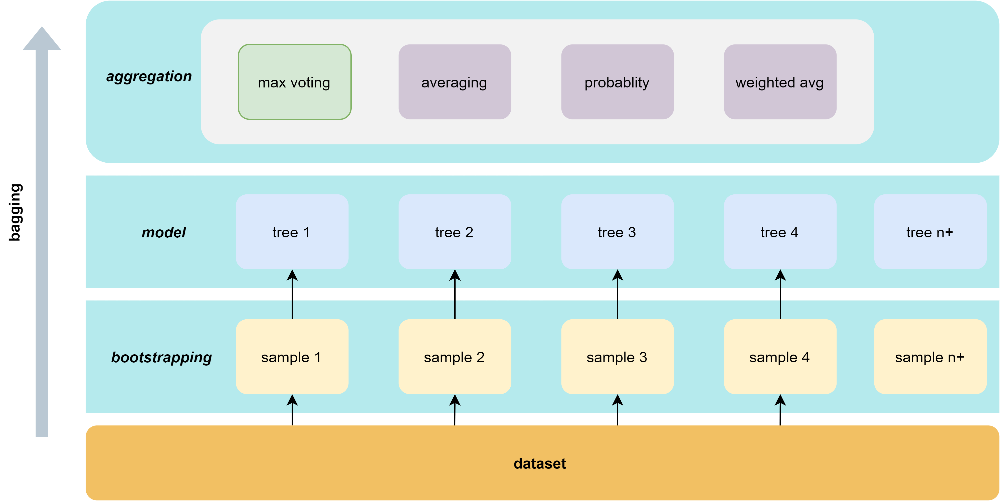

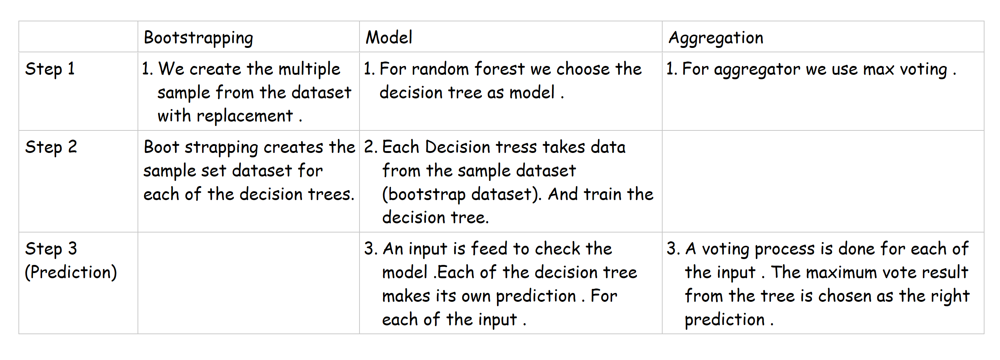

## Uses 
1. E-commerse - Stock predictions
2. Medical - To predict disease.
3. Banking - Dept return prediction.

## Advantages
1. It can be used for both classification and regeression.
2. It is less prone to Overfit.
3. Easy implementation with straightforward hyperparameters.
4. On top of that, it provides a pretty good indicator of the importance it assigns to your features.

## Disadvanteges
1. Large number of trees makes computation slow.
2. Random forest is a predictive modeling tool and not a descriptive tool, meaning if you're looking for a description of the relationships in your data, other approaches would be better.

## Implementation of Random Forest 
1. It can be implemented by using **`BaggingClassifier()`** class with **`base_estimators = DecisionTreeClassifier()`**.
2. High level implementation with **`RandomForestClassifier()`** class.

#  Random Forest model for cancer detection and classification into Malignant and Benign

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # statistical data visualization
%matplotlib inline
import plotly.graph_objs as go
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly import tools

import random
import re

# for pre-processing of the data
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

import warnings

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score,confusion_matrix,  classification_report, accuracy_score, precision_score,recall_score

# 1. Importing Data

In [2]:
train_data = pd.read_csv("cancer_data.csv")

# 2. Exploratory data analysis

### 2.1. See the mean, median, std, percentiles and range of data

In [3]:
train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


### 2.2. See for null values in any column

In [4]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

### Data don't have any kind of Null Value except last column so drop it

In [5]:
train_data.drop(["Unnamed: 32"], axis=1, inplace=True)

### 2.3 Target class distribution

#### M represents Malignant and B represents Benign cancer

<AxesSubplot:xlabel='diagnosis', ylabel='count'>

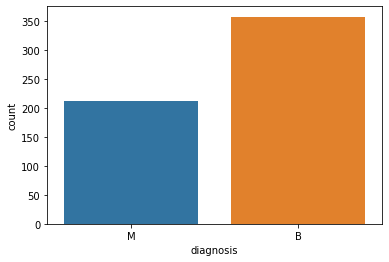

In [6]:
sns.countplot(x=train_data["diagnosis"], data=train_data )

### 2.4 Convert Target class into numerical data

In [7]:
replace = {"M":1,"B":0}
train_data['diagnosis'] = train_data['diagnosis'].map({'M': 1, 'B':0})

### 2.5 Heatmap for data

<AxesSubplot:>

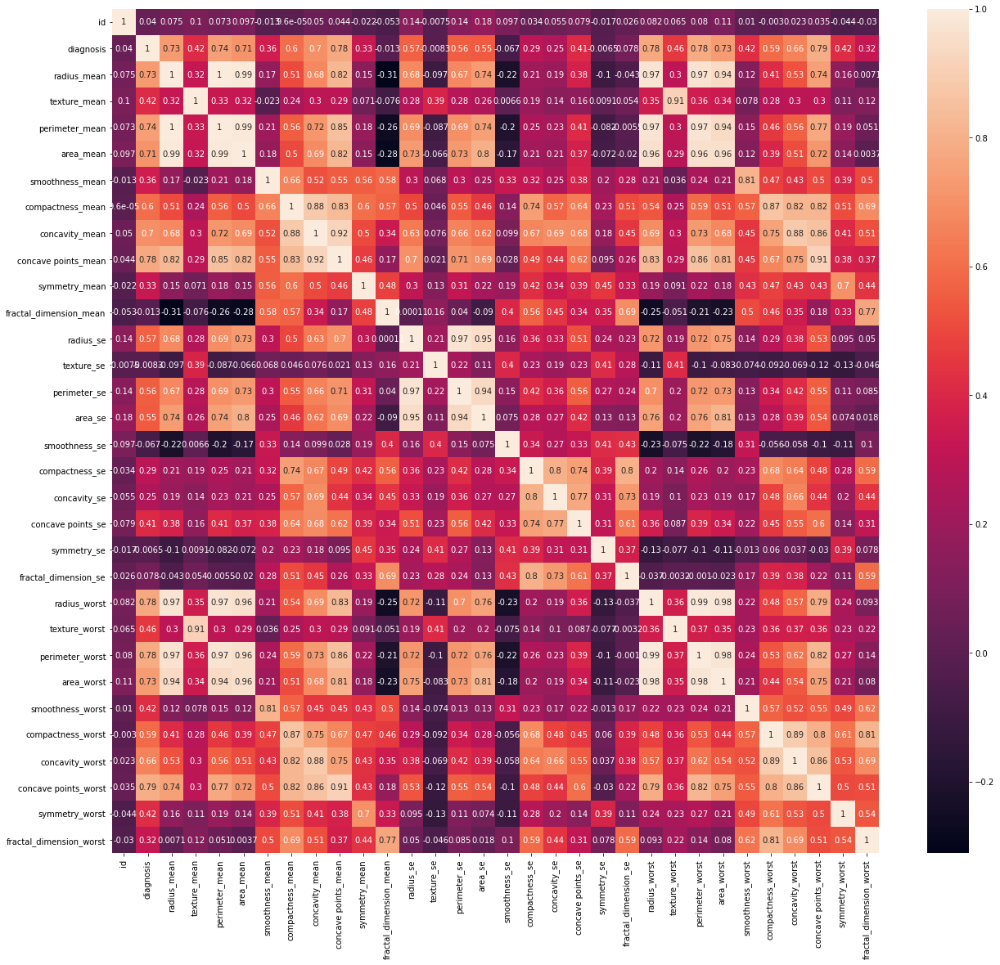

In [8]:
plt.figure(figsize=(21,19))
sns.heatmap(train_data.corr(), annot=True)

From correlation heatmap we can see that their is strong linear relationship between malignancy and 1. radius of nclear, 2. number of concave points. 3. perimeter and area.

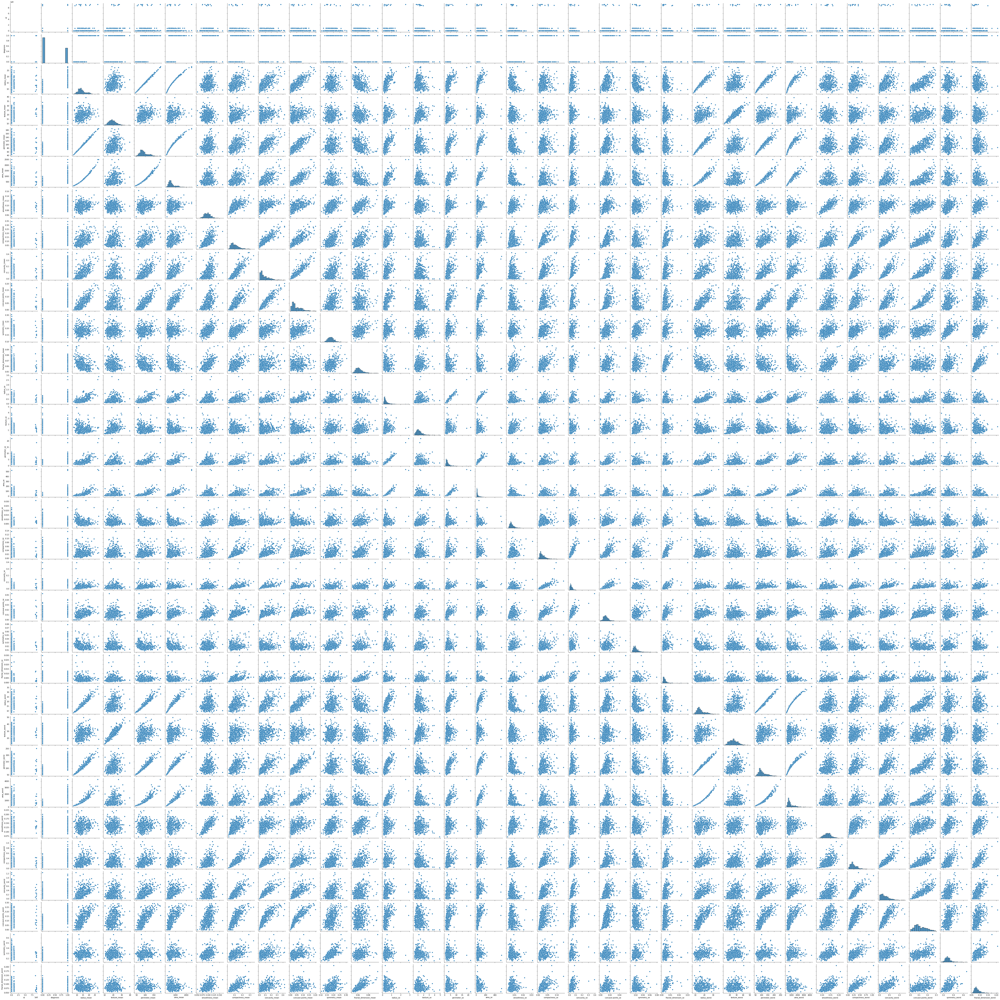

In [9]:
sns.pairplot(train_data)

### 2.7. Cross table breakdown by dignosis

In [10]:
features = train_data.drop("diagnosis", axis = 1).columns
train_data.groupby(["diagnosis"])[features].agg([np.mean, np.std, np.min, np.max])

id                                radius_mean            \
                   mean           std  amin       amax        mean       std   
diagnosis                                                                      
0          2.654382e+07  1.167397e+08  8913  911320502   12.146524  1.780512   
1          3.681805e+07  1.378965e+08  8670  911296202   17.462830  3.203971   

                         texture_mean            ... concave points_worst  \
             amin   amax         mean       std  ...                 amin   
diagnosis                                        ...                        
0           6.981  17.85    17.914762  3.995125  ...              0.00000   
1          10.950  28.11    21.604906  3.779470  ...              0.02899   

                 symmetry_worst                            \
            amax           mean       std    amin    amax   
diagnosis                                                   
0          0.175       0.270246  0.041745  0.1566  0.4228   
1          0.291       0.323468  0.074685  0.1565  0.6638   

          fractal_dimension_worst                             
                             mean       std     amin    amax  
diagnosis                                                     
0                        0.079442  0.013804  0.05521  0.1486  
1                        0.091530  0.021553  0.05504  0.2075  

[2 rows x 124 columns]

# 3. Splitting the data

In [11]:
x = train_data.drop(["diagnosis"], axis=1)
y = train_data["diagnosis"]


x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42)

# 4. Defining the Model 

### Hyperparameters-


1. Increasing the predictive power

 1. **`n_estimators`** - hyperparameter, which is just the number of trees the algorithm builds before taking the maximum voting or taking the averages of predictions. In general, a higher number of trees increases the performance and makes the predictions more stable, but it also slows down the computation.

 2. **`max_features`** - maximum number of features random forest considers to split a node. Sklearn provides several options, all described in the documentation.

 3. **`min_sample_leaf`** - This determines the minimum number of leafs required to split an internal node.

2. Increasing the model's speed

 1. **`n_jobs`** - tells the engine how many processors it is allowed to use. If it has a value of one, it can only use one processor. A value of “-1” means that there is no limit.

 2. **`random_state`** - hyperparameter makes the model’s output replicable.

 3. **`oob_score`** - (also called oob sampling), which is a random forest cross-validation method. In this sampling, about one-third of the data is not used to train the model and can be used to evaluate its performance. These samples are called the out-of-bag samples. It's very similar to the leave-one-out-cross-validation method, but almost no additional computational burden goes along with it.

## 4.1 Finding the best `n_estimators` value

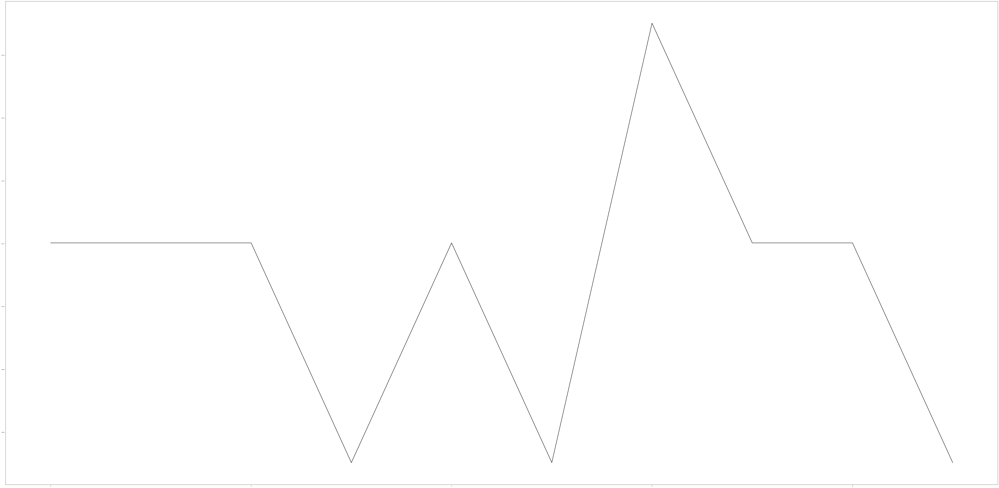

In [12]:
scores = []

for i in range(50,100,5):
    model = RandomForestClassifier(n_estimators=50)
    model.fit(x_train,y_train)
    scores.append(model.score(x_test,y_test))

plt.figure(figsize=(100,50))    
plt.plot(scores, linewidth=2, color="black")
plt.tick_params(axis='both', which='major', labelsize=6)
plt.show()

### From above we get max accuracy at 50 estimators

In [13]:
model = RandomForestClassifier(n_estimators=50, max_features=5,  n_jobs=-1, random_state=42)

model.fit(x_train,y_train)

y_pred = model.predict(x_test)

# 5. Evaluation of Model

In [14]:
model.score(x_test, y_test)

0.965034965034965

Text(33.0, 0.5, 'Actual value')

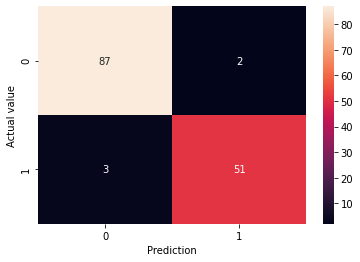

In [15]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True )
plt.xlabel("Prediction")
plt.ylabel("Actual value")

In [16]:
cp = classification_report(y_test, y_pred)
print(cp)

              precision    recall  f1-score   support

           0       0.97      0.98      0.97        89
           1       0.96      0.94      0.95        54

    accuracy                           0.97       143
   macro avg       0.96      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143



In [17]:
print("Accuracy ",accuracy_score(y_test, y_pred))

Accuracy  0.965034965034965


In [18]:
print("Recall ",recall_score(y_test, y_pred))

Recall  0.9444444444444444


In [19]:
print("Precision ",precision_score(y_test, y_pred))

Precision  0.9622641509433962


# 6. Hyperparameters tuning

In [20]:
params = {'max_features': range(1,11), 'min_samples_leaf': range(1,3),"" ,'max_depth': range(3,13), 'criterion':['gini','entropy']}  

model_cv = GridSearchCV(model, params, refit=True, verbose=3, n_jobs=-1, )

model_cv.fit(x_train, y_train)

SyntaxError: invalid syntax (<ipython-input-20-2817094aca79>, line 1)

In [ ]:
y_pred = model_cv.predict(x_test)

# 7. Evaluating the hyperparameters tunned model

In [ ]:
model.score(x_test, y_test)

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True )
plt.xlabel("Prediction")
plt.ylabel("Actual value")

In [ ]:
cp = classification_report(y_test, y_pred)
print(cp)

In [ ]:
print("Accuracy ",accuracy_score(y_test, y_pred))

In [ ]:
print("Recall ",recall_score(y_test, y_pred))

In [ ]:
print("Precision ",precision_score(y_test, y_pred))

# 8. Report
Aas for Predicting the disease we cannot let someone having the disease is predicted as healthy it can risk the life of patients so the metric that counts false negative that is recall should be higher and that is 94 %